# Aria Inference Recipes

## Section 4: (Long) Video Understanding

Aria is able to understand ver long videos with >100 frames as inputs. In this section, we show examples on several useful cases with its understanding ability on longer videos, as follows:

1. Summarizing a long video with details. 
2. Cutting a long video by scene transitions with timestamps.



### [General] Load Model and Processor

As the input size rapidly increases, we load the model and understand images with two 80GB GPUs (GPU 0, 1). If you find an OOM error, please try to let the model to see more GPUs. The `device_map="auto"` parameter will automatically shard model parameters to all visible GPUs.

In [1]:
# load Aria model & processor

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"

import requests
import torch
from PIL import Image
from transformers import AutoModelForCausalLM, AutoProcessor

model_id_or_path = "rhymes-ai/Aria"

model = AutoModelForCausalLM.from_pretrained(model_id_or_path, device_map="auto", torch_dtype=torch.bfloat16, trust_remote_code=True)

processor = AutoProcessor.from_pretrained(model_id_or_path, trust_remote_code=True)



/root/miniconda3/envs/aria/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
AriaMoELMForCausalLM has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you

### Defining Functions to Load Video and Generate Placeholders

In the following codeblocks, we define the function to load a video to uniformly-sampled frames, and get placeholders for the video for Aria.

These functions can be called as follows:

```python
frames, frame_timestamps  = load_video(VIDEO_PATH, num_frames=NUM_FRAMES)



### If you want to insert timestamps for Aria Inputs
contents = get_placeholders_for_videos(frames, frame_timestamps)

### If you DO NOT want to insert frame timestamps for Aria Inputs
contents = get_placeholders_for_videos(frames)
```

Please see the examples as follows:


In [2]:
from decord import VideoReader
from PIL import Image
from tqdm import tqdm
from typing import List


def load_video(video_file, num_frames=128, cache_dir="cached_video_frames", verbosity="DEBUG"):
    # Create cache directory if it doesn't exist
    os.makedirs(cache_dir, exist_ok=True)

    video_basename = os.path.basename(video_file)
    cache_subdir = os.path.join(cache_dir, f"{video_basename}_{num_frames}")
    os.makedirs(cache_subdir, exist_ok=True)

    cached_frames = []
    missing_frames = []
    frame_indices = []
    
    for i in range(num_frames):
        frame_path = os.path.join(cache_subdir, f"frame_{i}.jpg")
        if os.path.exists(frame_path):
            cached_frames.append(frame_path)
        else:
            missing_frames.append(i)
            frame_indices.append(i) 
            
    vr = VideoReader(video_file)
    duration = len(vr)
    fps = vr.get_avg_fps()
            
    frame_timestamps = [int(duration / num_frames * (i+0.5)) / fps for i in range(num_frames)]
    
    if verbosity == "DEBUG":
        print("Already cached {}/{} frames for video {}, enjoy speed!".format(len(cached_frames), num_frames, video_file))
    # If all frames are cached, load them directly
    if not missing_frames:
        return [Image.open(frame_path).convert("RGB") for frame_path in cached_frames], frame_timestamps

    

    actual_frame_indices = [int(duration / num_frames * (i+0.5)) for i in missing_frames]


    missing_frames_data = vr.get_batch(actual_frame_indices).asnumpy()

    for idx, frame_index in enumerate(tqdm(missing_frames, desc="Caching rest frames")):
        img = Image.fromarray(missing_frames_data[idx]).convert("RGB")
        frame_path = os.path.join(cache_subdir, f"frame_{frame_index}.jpg")
        img.save(frame_path)
        cached_frames.append(frame_path)

    cached_frames.sort(key=lambda x: int(os.path.basename(x).split('_')[1].split('.')[0]))
    return [Image.open(frame_path).convert("RGB") for frame_path in cached_frames], frame_timestamps

def create_image_gallery(images, columns=3, spacing=20, bg_color=(200, 200, 200)):
    """
    Combine multiple images into a single larger image in a grid format.
    
    Parameters:
        image_paths (list of str): List of file paths to the images to display.
        columns (int): Number of columns in the gallery.
        spacing (int): Space (in pixels) between the images in the gallery.
        bg_color (tuple): Background color of the gallery (R, G, B).
    
    Returns:
        PIL.Image: A single combined image.
    """
    # Open all images and get their sizes
    img_width, img_height = images[0].size  # Assuming all images are of the same size

    # Calculate rows needed for the gallery
    rows = (len(images) + columns - 1) // columns

    # Calculate the size of the final gallery image
    gallery_width = columns * img_width + (columns - 1) * spacing
    gallery_height = rows * img_height + (rows - 1) * spacing

    # Create a new image with the calculated size and background color
    gallery_image = Image.new('RGB', (gallery_width, gallery_height), bg_color)

    # Paste each image into the gallery
    for index, img in enumerate(images):
        row = index // columns
        col = index % columns

        x = col * (img_width + spacing)
        y = row * (img_height + spacing)

        gallery_image.paste(img, (x, y))

    return gallery_image


def get_placeholders_for_videos(frames: List, timestamps=[]):
    contents = []
    if not timestamps:
        for i, _ in enumerate(frames):
            contents.append({"text": None, "type": "image"})
        contents.append({"text": "\n", "type": "text"})
    else:
        for i, (_, ts) in enumerate(zip(frames, timestamps)):
            contents.extend(
                [
                    {"text": f"[{int(ts)//60:02d}:{int(ts)%60:02d}]", "type": "text"},
                    {"text": None, "type": "image"},
                    {"text": "\n", "type": "text"}
                ]
            )
    return contents

### Task 1: Summarizing a Long Video with Details

In the first example, we pass a burger making recipes including multiple sub-recipes, and let Aria to provide a brief summarization on this recipe. This recipe lasts around 6 minutes, while we sample 128 uniform frames to cover most of its contents (at around 1/3 fps). Let's start our Aria video journey.

#### With 128 uniform frames

In [3]:
frames, frame_timestamps = load_video("visuals/wxWo44MoCTI.mp4", num_frames=128)

Already cached 128/128 frames for video visuals/wxWo44MoCTI.mp4, enjoy speed!


In [4]:
contents = get_placeholders_for_videos(frames, frame_timestamps)

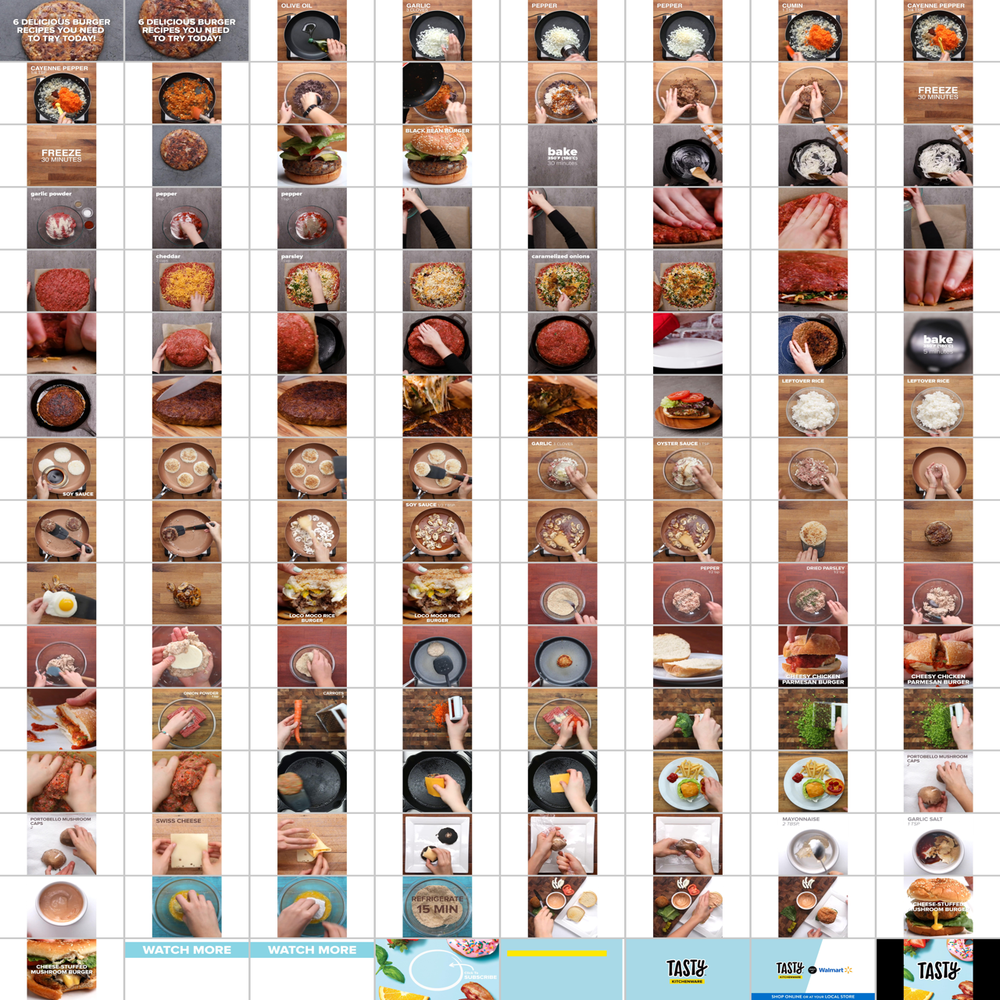

In [5]:
image_gallery = create_image_gallery(frames, columns=8)
display(image_gallery.resize((1280, 1280)))

In [6]:

messages = [
    {
        "role": "user",
        "content": [
            *contents,
            {"text": "This video has mentioned 6 burger recipes, but only 4 with names appear. Please list them, and briefly summarize how they are made.", "type": "text"},
        ],
    }
]

text = processor.apply_chat_template(messages, add_generation_prompt=True)
inputs = processor(text=text, images=frames, return_tensors="pt", max_image_size=490)
inputs["pixel_values"] = inputs["pixel_values"].to(model.dtype)
inputs = {k: v.to(model.device) for k, v in inputs.items()}

with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    output = model.generate(
        **inputs,
        max_new_tokens=2048,
        stop_strings=["<|im_end|>"],
        tokenizer=processor.tokenizer,
        do_sample=False,
    )
    output_ids = output[0][inputs["input_ids"].shape[1]:]
    result = processor.decode(output_ids, skip_special_tokens=True)

print(result)

/tmp/ipykernel_2251369/3922188265.py:16: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
/root/miniconda3/envs/aria/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:601: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.0` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.
Starting from v4.46, the `logits` model output will have the same type as the model (except at train time, where it will always be FP32)




The video mentions six burger recipes, but only four of them are named. Here are the named burgers and a brief summary of how they are made:

1. **Black Bean Burger**:
   - **Preparation**: The video shows the process of making a black bean burger, starting with sautéing onions and garlic, then mixing the ingredients in a bowl, forming patties, and baking them.
   - **Assembly**: The final step involves assembling the burger with toppings like lettuce, tomato, and avocado.

2. **Cheesy Chicken Parmesan Burger**:
   - **Preparation**: The video demonstrates making a cheesy chicken parmesan burger by preparing a breaded chicken patty, frying it, and then assembling the burger with cheese and sauce.
   - **Assembly**: The burger is completed with a bun and served with fries.

3. **Loco Moco Rice Burger**:
   - **Preparation**: This recipe involves making a rice patty, mixing it with seasonings, forming it into a patty, and cooking it in a pan.
   - **Assembly**: The rice patty is topped

Similarly, we can also require a structured output for this.

In [7]:
from IPython.display import Markdown, display


messages = [
    {
        "role": "user",
        "content": [
            *contents,
            {"text": "This video has mentioned 6 burger recipes, but only 4 with names appear. Please list them, and summarize how they are made in details. Reply me with a structured output in JSON format.", "type": "text"},
        ],
    }
]

text = processor.apply_chat_template(messages, add_generation_prompt=True)
inputs = processor(text=text, images=frames, return_tensors="pt", max_image_size=490)
inputs["pixel_values"] = inputs["pixel_values"].to(model.dtype)
inputs = {k: v.to(model.device) for k, v in inputs.items()}

with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    output = model.generate(
        **inputs,
        max_new_tokens=2048,
        stop_strings=["<|im_end|>"],
        tokenizer=processor.tokenizer,
        do_sample=False,
        temperature=0.,
    )
    output_ids = output[0][inputs["input_ids"].shape[1]:]
    result = processor.decode(output_ids, skip_special_tokens=True)

display(Markdown(result))

/tmp/ipykernel_2251369/3221518979.py:19: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):




```json
{
  "burger_recipes": [
    {
      "name": "Black Bean Burger",
      "summary": "The video shows the preparation of a black bean burger. It starts with a cooked patty on a plate, followed by the assembly of the burger with lettuce, tomato, avocado, and onion on a bun. The patty is baked at 350°F for 30 minutes before assembly."
    },
    {
      "name": "Cheesy Chicken Parmesan Burger",
      "summary": "The video demonstrates the preparation of a cheesy chicken parmesan burger. It includes making patties with ground meat, adding spices, and cooking them in a pan. The patties are then topped with cheese and served with fries and ketchup."
    },
    {
      "name": "Loco Moco Rice Burger",
      "summary": "The video shows the preparation of a loco moco rice burger. It involves making patties with ground meat and rice, cooking them in a pan, and serving them with a fried egg and gravy on top."
    },
    {
      "name": "Cheese-Stuffed Mushroom Burger",
      "summary": "The video demonstrates the preparation of a cheese-stuffed mushroom burger. It includes making patties with ground meat and mushrooms, cooking them in a pan, and serving them with cheese and sauce on a bun."
    }
  ]
}
```<|im_end|>

#### With 384 uniform frames

In the previous examples, we have noticed that there are only four burger names appearing in the sampled frames, though this video actually includes a recipe of 6 burgers. While we watch and check the video, we confirmt that there are still two burgers with names appearing and disappearing very fast, resulting that **frames with their names are still not sampled**. 

Therefore, we directly increase to sample 384 frames for this video (at about 1fps), and see whether more burger names can appear, and more importantly, still captured by the Aria model.

In [8]:
frames, frame_timestamps = load_video("visuals/wxWo44MoCTI.mp4", num_frames=384)
contents = get_placeholders_for_videos(frames, frame_timestamps)

Already cached 384/384 frames for video visuals/wxWo44MoCTI.mp4, enjoy speed!


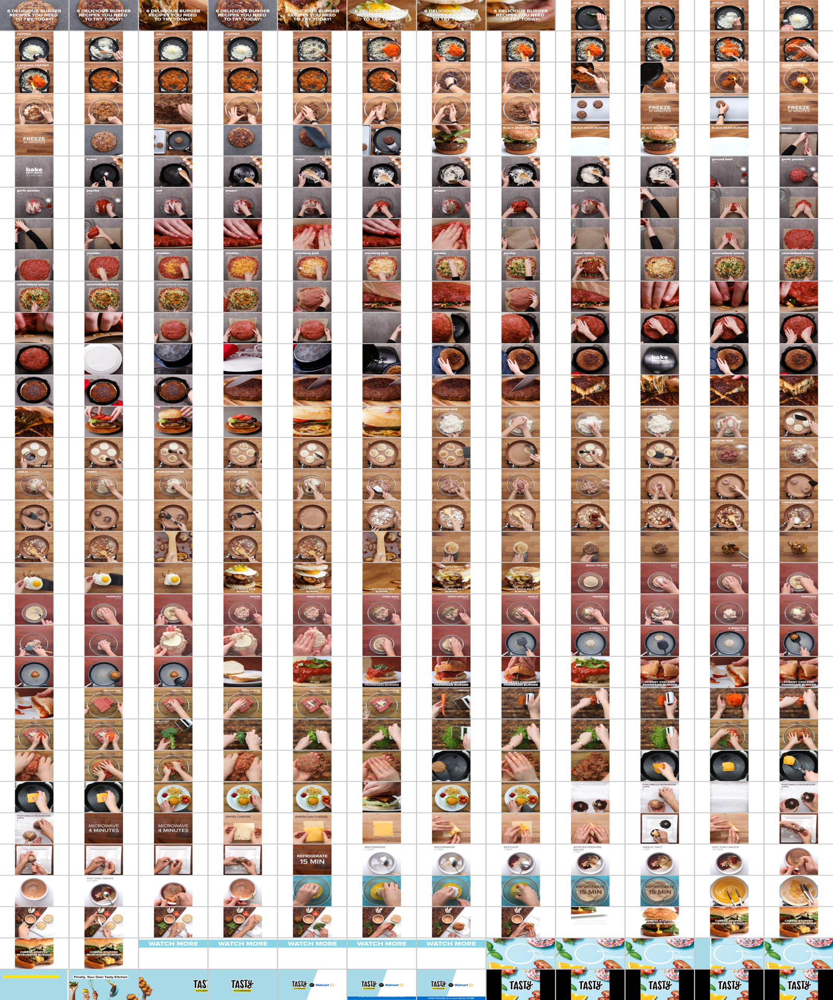

In [9]:
image_gallery = create_image_gallery(frames, columns=12)
display(image_gallery.resize((1600, 1920)))

In [10]:
torch.cuda.empty_cache()

messages = [
    {
        "role": "user",
        "content": [
            *contents,
            {"text": "Please list the burgers that appear in this video, and how they are made.", "type": "text"},
        ],
    }
]

text = processor.apply_chat_template(messages, add_generation_prompt=True)
inputs = processor(text=text, images=frames, return_tensors="pt", max_image_size=490)
inputs["pixel_values"] = inputs["pixel_values"].to(model.dtype)
inputs = {k: v.to(model.device) for k, v in inputs.items()}

with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    output = model.generate(
        **inputs,
        max_new_tokens=2048,
        stop_strings=["<|im_end|>"],
        tokenizer=processor.tokenizer,
        do_sample=False,
        temperature=0.,
    )
    output_ids = output[0][inputs["input_ids"].shape[1]:]
    result = processor.decode(output_ids, skip_special_tokens=True)

print(result)

/tmp/ipykernel_2251369/968247152.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):



The video showcases the following burgers and their preparation methods:

1. **Black Bean Burger**
   - **Ingredients**: Black beans, carrots, onions, spices (cumin, coriander, chili powder, salt, pepper), quick oats, cheddar cheese, Monterey Jack cheese, parsley, bacon lattice, tomato, lettuce.
   - **Preparation**:
     1. Mix black beans, carrots, and spices in a bowl.
     2. Add quick oats and cheese, then form into patties.
     3. Cook in a skillet, then bake with additional cheese and toppings.

2. **Giant Cheese-Stuffed Burger**
   - **Ingredients**: Ground beef, onion, garlic, breadcrumbs, Worcestershire sauce, oyster sauce, soy sauce, mushrooms, beef stock, cornstarch slurry, cheese, egg, lettuce, tomato, pickles.
   - **Preparation**:
     1. Mix ground beef with seasonings and form into patties with cheese in the center.
     2. Cook patties, then prepare mushroom sauce.
     3. Assemble burger with sauce, cheese, and toppings.

3. **Loco Moco Rice Burger**
   - **Ingredi

#### Summary

With 3 times frames sampled, this time we finally get the name of the fifth burger, **Giant Cheese-Stuffed Burger**. However, these frames (see the gallery above) still do not include the sixth burger's name (which is **Hidden Veggie Burger**, as we have really watched this video from start to end). 

This 'non-perfect' case has shown that a model that is able to alloow more frames as inputs are ***more useful than we all can expect***; 

On the other hand, with more frames (384 vs 128) fed into the model, Aria is capable of extracting the additional burger name that appears in the middle of the video, while summarizing the recipe for the appeared five burgers very effectively. 

We hope this exciting ability can allow Aria a new landmark for open-source LMMs on long video understanding, and inspire many new application scenarios.

### Task 2: Splitting a Long Video into Scenes (with Timestamps)

With timestamps interleaved with frames as Aria Inputs, we can do some more interesting tasks, for instance, split a video into multiple segments, and label their starting and ending timestamps. This is very useful for long videos to understand their structures, and can directly benefit watchers (who can directly watch the 'scenes-of-interest'). We show the example as follows.

In [11]:
frames, frame_timestamps = load_video("visuals/QdlP8ai8trw.mp4", num_frames=128)
contents = get_placeholders_for_videos(frames, frame_timestamps)

Already cached 128/128 frames for video /cpfs/data/user/teowu/video_mme/data/QdlP8ai8trw.mp4, enjoy speed!


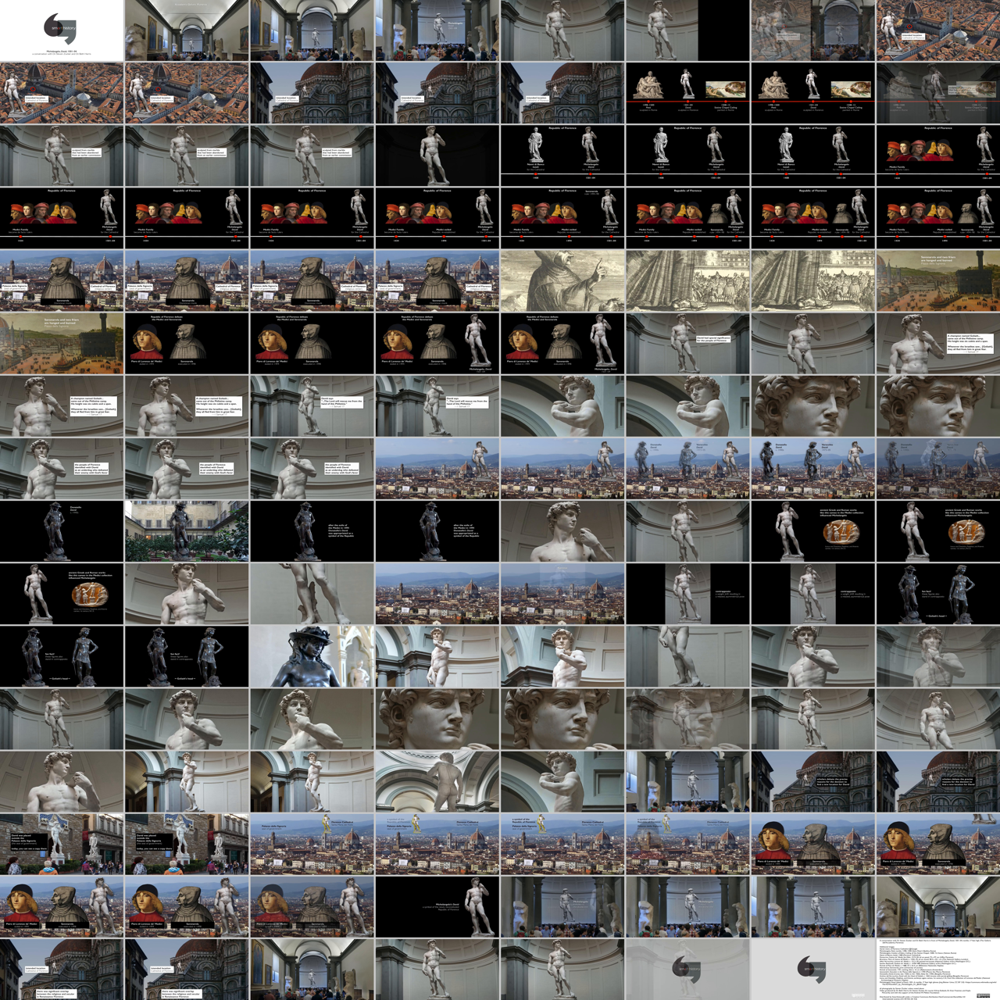

In [12]:
image_gallery = create_image_gallery(frames, columns=8)
display(image_gallery.resize((1280, 1280)))

In [13]:
torch.cuda.empty_cache()

messages = [
    {
        "role": "user",
        "content": [
            *contents,
            {"text": "Please split this video into scenes, providing start time, end time, a title and detailed descriptions for each scene.", "type": "text"},
        ],
    }
]

text = processor.apply_chat_template(messages, add_generation_prompt=True)
inputs = processor(text=text, images=frames, return_tensors="pt", max_image_size=490)
inputs["pixel_values"] = inputs["pixel_values"].to(model.dtype)
inputs = {k: v.to(model.device) for k, v in inputs.items()}

with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    output = model.generate(
        **inputs,
        max_new_tokens=2048,
        stop_strings=["<|im_end|>"],
        tokenizer=processor.tokenizer,
        do_sample=False,
        temperature=0.,
    )
    output_ids = output[0][inputs["input_ids"].shape[1]:]
    result = processor.decode(output_ids, skip_special_tokens=True)

print(result)

/tmp/ipykernel_2251369/483815914.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.inference_mode(), torch.cuda.amp.autocast(dtype=torch.bfloat16):




Certainly! Here are the scenes from the video, along with their start and end times, and detailed descriptions:

1. **Scene 1: Introduction**
   - **Start Time:** 00:01
   - **End Time:** 00:05
   - **Title:** Introduction
   - **Description:** The video opens with a title screen featuring the 'smarthistory' logo and the text 'Michelangelo, David, 1501-04,' indicating a conversation with Dr. Steven Zucker and Dr. Beth Harris.

2. **Scene 2: Accademia Gallery, Florence**
   - **Start Time:** 00:05
   - **End Time:** 00:40
   - **Title:** Accademia Gallery, Florence
   - **Description:** The scene transitions to the interior of the Accademia Gallery in Florence, showcasing Michelangelo's David statue surrounded by visitors. The focus is on the statue and its historical context.

3. **Scene 3: Historical Context**
   - **Start Time:** 00:40
   - **End Time:** 01:08
   - **Title:** Historical Context
   - **Description:** The scene shifts to a timeline highlighting significant artworks a